In [1]:
#:::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::#
#                                                                               #
# Part of solution to exercise set for week 12                                  #
# IN4500 - Machine Learning for Image analysis                                  #
# University of Oslo                                                            #
#                                                                               #
#                                                                               #
# Ole-Johan Skrede    olejohas at ifi dot uio dot no                            #
# 2019.03.31                                                                    #
#                                                                               #
#:::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::#

"""Implementation of simple t-SNE"""

from pathlib import Path
import time

import torch
import torchvision
from matplotlib.cm import get_cmap
import matplotlib.pyplot as plt
import numpy as np



In [16]:
def config():
    """Return a dict of configuration settings used in the program"""

    conf = {}

    # Paths for outputs
    conf['job_dir'] = Path('/tmp/tsne/')
    # Relevant dataset will be put in this location after download
    conf['data_dir'] = Path('/tmp/mnist_data')
    # Location to place output
    conf['output_dir'] = conf['job_dir'].joinpath('output')

    # Create directories
    if not conf['output_dir'].exists():
        conf['output_dir'].mkdir(parents=True)

    conf['device'] = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

    conf['height'] = 28
    conf['width'] = 28

    conf['num_iter'] = 700
    conf['learning_rate'] = 0.1

    conf['sigma'] = 10

    
    # Increase to  500 or 1000 if you have sufficient RAM
    conf['num_images'] = 100

    # The number of dimensions that we are mapping data to. Visualization is only implemented for 2
    conf['map_dimensions'] = 2

    # How often (in steps) to log the training progress (to stdout)
    conf['monitor_progress'] = 1
    conf['write_snapshot'] = 1

    return conf

In [17]:
def plot_scatter(data, labels, filename):
    """
    Scatter plot of data.

    Args:
        data: numpy array of shape (n, 2) with n (x, y) coordinates
        labels: a list of length n with labels corresponding to the data
        filename: full filepath of where to write the scatter plot
    """
    _, ax = plt.subplots()
    cmap = get_cmap('tab10')
    for label in sorted(np.unique(labels)):
        indices = np.where(labels == label)
        ax.scatter(data[indices, 0], data[indices, 1], color=cmap(label), label=label)
    plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left', borderaxespad=0.0)
    plt.savefig(filename, bbox_inches='tight')


In [18]:
def pairwise_distances(data):
    """
    data is a tensor of size m x n, that is, a tensor with m
    datapoints, each with n dimensions. This function computes the L2 distance between point i and
            j for all points i=1, ..., m.

    To understand how it does it, consider a simplified version where n = 1:

    data = [1, 2, 3, 4]

    If you take the difference between this vector and its transpose, data - data^t

                    [ 1 ]
                    [ 2 ]
                    [ 3 ]
    [1, 2, 3, 4] -  [ 4 ]

    you get (via broadcasting)

    [ 0,  1,  2,  3]
    [-1,  0,  1,  2]
    [-2, -1,  0,  1]
    [-3, -2, -1,  0]

    The same method is used below, except datapoints are n-dimensional
    """
    num_points, num_dims = data.shape
    # np.expand_dims(data, axis=0)
    data_i = data.unsqueeze(0).expand(num_points, num_points, num_dims)
    # np.expand_dims(data, axis=1)
    data_j = data.unsqueeze(1).expand(num_points, num_points, num_dims)
    dist_ij = (data_i - data_j).pow(2).sum(dim=2).squeeze()
    return dist_ij


In [19]:
def asymmetric_gauss_neighbour_probability(data, sigma, swap_conditionality, device):
    """
    For given input data, return

    Pr(X_j = x_j | X_i = x_i) for all datapoint pairs x_i, x_j

    as described in the lecture slides page 29 and 30.
    """
    num_points, _ = data.shape
    distances = pairwise_distances(data)
    neigh_relation = distances.mul(-1/(2*sigma)).exp()
    if swap_conditionality:
        neigh_relation = neigh_relation.transpose(0, 1)
    # Delete diagonal elements
    not_diag_mask = (1 - torch.eye(num_points, dtype=torch.uint8)).to(device)
    neigh_relation = torch.masked_select(neigh_relation, not_diag_mask)\
        .view(num_points, num_points-1)
    prob = neigh_relation / (neigh_relation.sum(dim=1).view(num_points, 1))
    return prob


In [20]:
def symmetric_gauss_neighbour_probability(data, sigma, device):
    """
    For given input data, return

    Pr(X_i = x_i, X_j = x_j) for all datapoint pairs x_i, x_j

    as described in the lecture slides page 42
    """
    num_points, _ = data.shape
    p_j_given_i = asymmetric_gauss_neighbour_probability(data, sigma, False, device)
    p_i_given_j = asymmetric_gauss_neighbour_probability(data, sigma, True, device)
    p_joint_ij = (p_j_given_i + p_i_given_j) / (2 * num_points)
    return p_joint_ij


In [21]:
def symmetric_student_t_neighbour_probability(data, device):
    """
    For given input data, return

    Pr(X_i = x_i, X_j = x_j) for all datapoint pairs x_i, x_j

    as described in the lecture slides page 44
    """
    num_points, _ = data.shape
    distances = pairwise_distances(data)
    # Delete diagonal elements
    not_diag_mask = (1 - torch.eye(num_points, dtype=torch.uint8)).to(device)
    distances = torch.masked_select(distances, not_diag_mask).view(num_points, num_points-1)
    neigh_relation = distances.add(1).pow(-1)
    # Delete diagonal elements
    p_prob = neigh_relation / (neigh_relation.sum())
    return p_prob

Start program
Random seed: 12345678
Step:      1 Loss:  0.9249 Sec/step: 0.11900
Step:      2 Loss:  0.8854 Sec/step: 0.42000
Step:      3 Loss:  0.8486 Sec/step: 0.40800
Step:      4 Loss:  0.8153 Sec/step: 0.39800
Step:      5 Loss:  0.7850 Sec/step: 0.44800
Step:      6 Loss:  0.7574 Sec/step: 0.40800
Step:      7 Loss:  0.7324 Sec/step: 0.39900
Step:      8 Loss:  0.7093 Sec/step: 0.43500
Step:      9 Loss:  0.6870 Sec/step: 0.39500
Step:     10 Loss:  0.6649 Sec/step: 0.40100
Step:     11 Loss:  0.6433 Sec/step: 0.39400
Step:     12 Loss:  0.6226 Sec/step: 0.61800
Step:     13 Loss:  0.6037 Sec/step: 0.42900
Step:     14 Loss:  0.5867 Sec/step: 0.40400
Step:     15 Loss:  0.5714 Sec/step: 0.41300
Step:     16 Loss:  0.5573 Sec/step: 0.41700
Step:     17 Loss:  0.5438 Sec/step: 0.39600
Step:     18 Loss:  0.5306 Sec/step: 0.39400
Step:     19 Loss:  0.5176 Sec/step: 0.44300
Step:     20 Loss:  0.5048 Sec/step: 0.47100
Step:     21 Loss:  0.4923 Sec/step: 0.44300


C:\Users\anne\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # Remove the CWD from sys.path while we load stuff.


Step:     22 Loss:  0.4805 Sec/step: 0.48500
Step:     23 Loss:  0.4695 Sec/step: 0.43500
Step:     24 Loss:  0.4592 Sec/step: 0.35300
Step:     25 Loss:  0.4497 Sec/step: 0.42000
Step:     26 Loss:  0.4409 Sec/step: 0.44200
Step:     27 Loss:  0.4330 Sec/step: 0.43500
Step:     28 Loss:  0.4258 Sec/step: 0.35400
Step:     29 Loss:  0.4195 Sec/step: 0.35500
Step:     30 Loss:  0.4138 Sec/step: 0.37200
Step:     31 Loss:  0.4089 Sec/step: 0.36800
Step:     32 Loss:  0.4046 Sec/step: 0.53500
Step:     33 Loss:  0.4009 Sec/step: 0.50800
Step:     34 Loss:  0.3975 Sec/step: 0.58800
Step:     35 Loss:  0.3945 Sec/step: 0.38900
Step:     36 Loss:  0.3916 Sec/step: 0.41400
Step:     37 Loss:  0.3888 Sec/step: 0.54300
Step:     38 Loss:  0.3861 Sec/step: 0.53100
Step:     39 Loss:  0.3836 Sec/step: 0.46700
Step:     40 Loss:  0.3813 Sec/step: 0.43500
Step:     41 Loss:  0.3792 Sec/step: 0.40900
Step:     42 Loss:  0.3774 Sec/step: 0.40800
Step:     43 Loss:  0.3759 Sec/step: 0.37100
Step:     

Step:    205 Loss:  0.2987 Sec/step: 0.35400
Step:    206 Loss:  0.2987 Sec/step: 0.39400
Step:    207 Loss:  0.2987 Sec/step: 0.46400
Step:    208 Loss:  0.2987 Sec/step: 0.46600
Step:    209 Loss:  0.2986 Sec/step: 0.34800
Step:    210 Loss:  0.2986 Sec/step: 0.38500
Step:    211 Loss:  0.2986 Sec/step: 0.41000
Step:    212 Loss:  0.2986 Sec/step: 0.40600
Step:    213 Loss:  0.2986 Sec/step: 0.37500
Step:    214 Loss:  0.2986 Sec/step: 0.34100
Step:    215 Loss:  0.2986 Sec/step: 0.35300
Step:    216 Loss:  0.2986 Sec/step: 0.34200
Step:    217 Loss:  0.2986 Sec/step: 0.53500
Step:    218 Loss:  0.2986 Sec/step: 0.38300
Step:    219 Loss:  0.2986 Sec/step: 0.38400
Step:    220 Loss:  0.2985 Sec/step: 0.38900
Step:    221 Loss:  0.2985 Sec/step: 0.37600
Step:    222 Loss:  0.2985 Sec/step: 0.40800
Step:    223 Loss:  0.2985 Sec/step: 0.39300
Step:    224 Loss:  0.2985 Sec/step: 0.68500
Step:    225 Loss:  0.2985 Sec/step: 0.41200
Step:    226 Loss:  0.2985 Sec/step: 0.37100
Step:    2

Step:    388 Loss:  0.2978 Sec/step: 0.35100
Step:    389 Loss:  0.2978 Sec/step: 0.35100
Step:    390 Loss:  0.2978 Sec/step: 0.35600
Step:    391 Loss:  0.2978 Sec/step: 0.59900
Step:    392 Loss:  0.2978 Sec/step: 0.52900
Step:    393 Loss:  0.2978 Sec/step: 0.42700
Step:    394 Loss:  0.2978 Sec/step: 0.48200
Step:    395 Loss:  0.2978 Sec/step: 0.43800
Step:    396 Loss:  0.2978 Sec/step: 0.38700
Step:    397 Loss:  0.2978 Sec/step: 0.36300
Step:    398 Loss:  0.2978 Sec/step: 0.64500
Step:    399 Loss:  0.2978 Sec/step: 0.73800
Step:    400 Loss:  0.2978 Sec/step: 0.42500
Step:    401 Loss:  0.2978 Sec/step: 0.37500
Step:    402 Loss:  0.2978 Sec/step: 0.37500
Step:    403 Loss:  0.2978 Sec/step: 0.61400
Step:    404 Loss:  0.2978 Sec/step: 0.45700
Step:    405 Loss:  0.2978 Sec/step: 0.43000
Step:    406 Loss:  0.2978 Sec/step: 0.36900
Step:    407 Loss:  0.2978 Sec/step: 0.36600
Step:    408 Loss:  0.2978 Sec/step: 0.39300
Step:    409 Loss:  0.2978 Sec/step: 0.37700
Step:    4

Step:    571 Loss:  0.2976 Sec/step: 0.41200
Step:    572 Loss:  0.2976 Sec/step: 0.42800
Step:    573 Loss:  0.2976 Sec/step: 0.41800
Step:    574 Loss:  0.2976 Sec/step: 0.40500
Step:    575 Loss:  0.2976 Sec/step: 0.41500
Step:    576 Loss:  0.2976 Sec/step: 0.43000
Step:    577 Loss:  0.2976 Sec/step: 0.45100
Step:    578 Loss:  0.2976 Sec/step: 0.43300
Step:    579 Loss:  0.2976 Sec/step: 0.42200
Step:    580 Loss:  0.2976 Sec/step: 0.40900
Step:    581 Loss:  0.2976 Sec/step: 0.39500
Step:    582 Loss:  0.2976 Sec/step: 1.26000
Step:    583 Loss:  0.2976 Sec/step: 0.42100
Step:    584 Loss:  0.2976 Sec/step: 0.45200
Step:    585 Loss:  0.2976 Sec/step: 0.56700
Step:    586 Loss:  0.2976 Sec/step: 0.61900
Step:    587 Loss:  0.2976 Sec/step: 0.45500
Step:    588 Loss:  0.2976 Sec/step: 0.42000
Step:    589 Loss:  0.2976 Sec/step: 0.42600
Step:    590 Loss:  0.2976 Sec/step: 0.39700
Step:    591 Loss:  0.2976 Sec/step: 0.42800
Step:    592 Loss:  0.2976 Sec/step: 0.40900
Step:    5

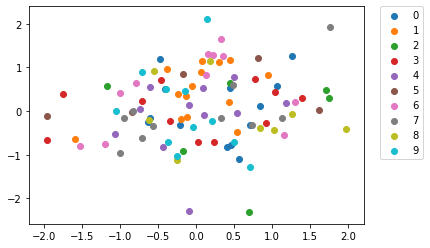

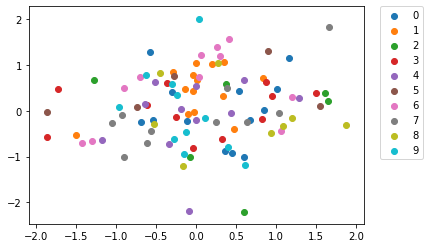

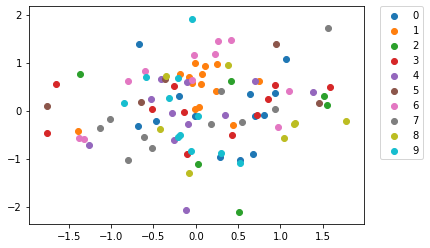

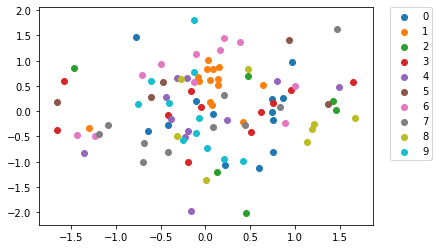

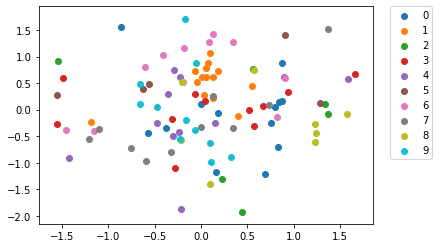

...

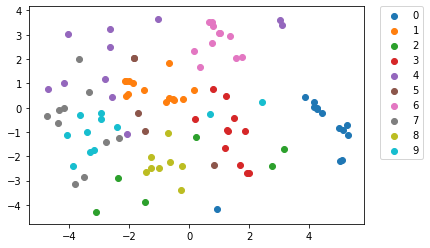

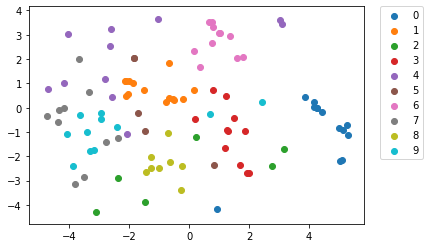

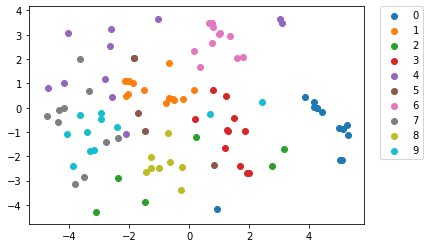

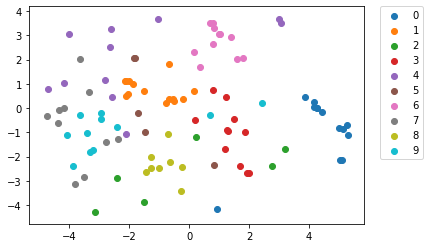

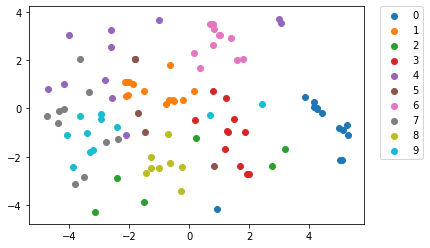

In [22]:
"""Main"""
print("Start program")
torch.manual_seed(12345678)
print("Random seed:", torch.initial_seed())
conf = config()

# Extract a single batch and use it as our data
data_loader = torch.utils.data.DataLoader(
torchvision.datasets.MNIST(
            conf['data_dir'],
            train=True,
            download=True,
            transform=torchvision.transforms.Compose([torchvision.transforms.ToTensor()])
            ),
            batch_size=conf['num_images'],
            shuffle=False,
            )
images, labels = next(iter(data_loader))
images = images.view(-1, conf['height'] * conf['width'])
images = images.to(conf['device'])

map_points = torch.randn(
        conf['num_images'],
        conf['map_dimensions'],
        device=conf['device'],
        dtype=torch.float,
        requires_grad=True,
        )

optimizer = torch.optim.Adam([map_points], lr=conf['learning_rate'])

snapshot_num = 0
running_loss = 0
prev_time = time.time()
for iteration in range(1, conf['num_iter']+1):
        p_ij = symmetric_gauss_neighbour_probability(images, conf['sigma'], conf['device'])
        q_ij = symmetric_student_t_neighbour_probability(map_points, conf['device'])
        loss = (p_ij * (p_ij/q_ij).log()).sum()
        loss.backward()

        optimizer.step()
        optimizer.zero_grad()
        #with torch.no_grad():
        #    map_points -= conf['learning_rate'] * map_points.grad
        #    map_points.grad.zero_()

        running_loss += loss.item()
        if iteration % conf['monitor_progress'] == 0:
            elapsed_time = time.time() - prev_time
            prev_time = time.time()
            secs_per_step = elapsed_time / conf['monitor_progress']
            print(
                "Step: {:>6} Loss: {:>7.4f} Sec/step: {:.5f}"
                .format(iteration, running_loss / conf['monitor_progress'], secs_per_step)
                )
            running_loss = 0
        if iteration % conf['write_snapshot'] == 0:
            filename = conf['output_dir'].joinpath(
                'mapping_{:03}_iter_{:03}.png'.format(snapshot_num, iteration)
                )
            plot_scatter(
                map_points.cpu().detach().numpy(),
                labels.cpu().detach().numpy(),
                filename,
                )
            snapshot_num += 1